In [1]:
import squidpy as sq
import numpy as np
from gpzoo.utilities import regularized_nmf, dims_autocorr
import matplotlib.pyplot as plt

/gladstone/engelhardt/home/lchumpitaz/miniconda3/envs/nsf/lib/python3.9/site-packages/geopandas/_compat.py:124: UserWarning: The Shapely GEOS version (3.11.1-CAPI-1.17.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(
/gladstone/engelhardt/home/lchumpitaz/miniconda3/envs/nsf/lib/python3.9/site-packages/spatialdata/__init__.py:9: UserWarning: Geopandas was set to use PyGEOS, changing to shapely 2.0 with:

	geopandas.options.use_pygeos = True

If you intended to use PyGEOS, set the option to False.
  _check_geopandas_using_shapely()
/gladstone/engelhardt/home/lchumpitaz/gitclones/GPzoo/gpzoo/utilities.py:2: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [7]:
random_seed = 8

In [2]:
adata = sq.datasets.slideseqv2()

In [4]:
# Y_sums = np.array(np.sum(adata.raw.X > 0, axis=0))[0]
# mask = Y_sums>1
Y_float = np.array(adata.raw.X[:].todense(), dtype=float).T
Y_int = np.array(adata.raw.X[:].todense()*100, dtype=int).T

In [5]:
X = adata.obsm['spatial']

In [8]:
L = 20
F, W = regularized_nmf(Y_int.T, L=L, shrinkage=0.3, max_iter = 1000, solver='mu', init='nndsvdar', beta_loss='kullback-leibler', random_state=random_seed)

In [9]:
moran_idx, moranI = dims_autocorr(np.exp(F), X)

In [10]:
loadings = np.exp(F.T)[moran_idx]

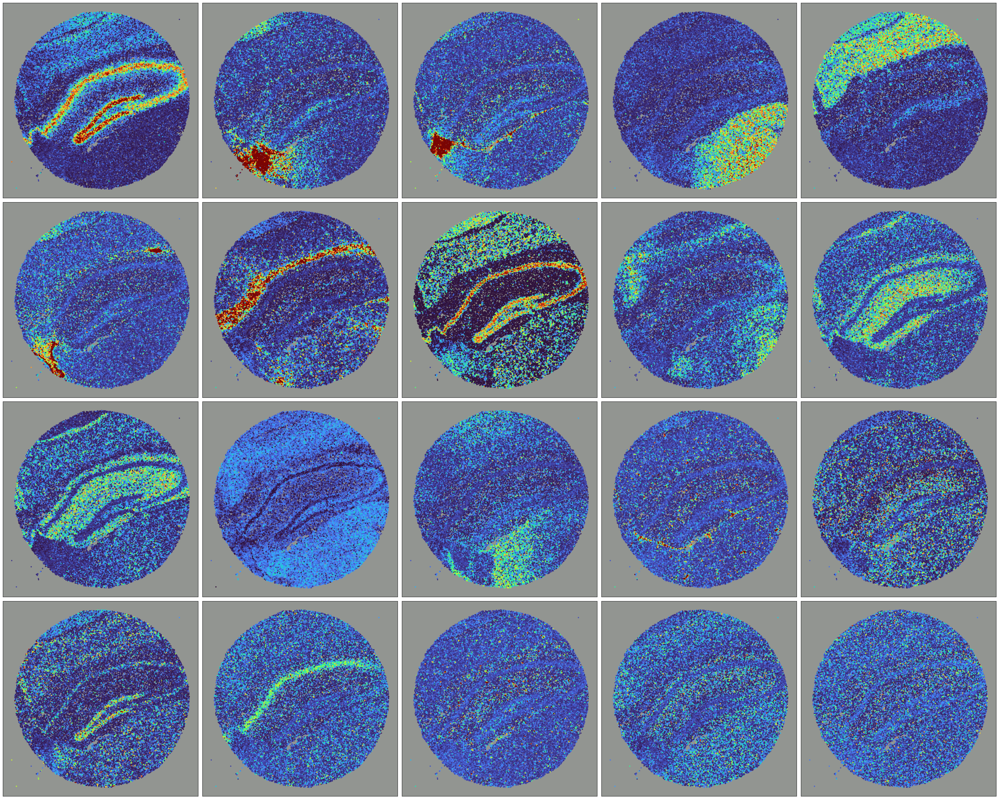

In [12]:
max_val = np.percentile(loadings, 99)
min_val = np.percentile(loadings, 1)


size = 7
plt.figure(figsize=(size*5, size*4), tight_layout=True)
for i in range(L):
    plt.subplot(L//5, 5, i+1)
    plt.scatter(X[:, 0], X[:,1], c=loadings[i], vmin=min_val, vmax=max_val, alpha=0.9, s=5, cmap='turbo')
        
    plt.gca().invert_yaxis()
    plt.xticks([])
    plt.yticks([])
    plt.gca().set_facecolor('xkcd:gray')


plt.savefig('../figures/slideseq_nmf/slideseq_v2_nmf_seed_'+str(random_seed)+'.png', dpi=200)
